In [1]:
# Copyright (C) 2022 Intel Corporationworkbench.action.openLargeOutput
#
# SPDX-License-Identifier: MIT

import os
import datumaro as dm
import time
import random

from datumaro.components.searcher import Searcher
from datumaro.components.visualizer import Visualizer

#### device:  cuda


## eurosat

In [2]:
start_time = time.time()
# dataset = dm.Dataset.import_from('./tests/assets/coco_dataset/coco', save_hash=True)
# dataset = dm.Dataset.import_from("coco_dataset", format='coco_instances', save_hash=True)
eurosat_dataset = dm.Dataset.import_from("/media/hdd2/datumaro/clf_data/eurosat/train", format="imagenet", save_hash=True)
print(f'setting dataset time for {len(eurosat_dataset)} items: ', time.time()-start_time)

13500it [01:48, 124.04it/s]

setting dataset time for 13500 items:  109.1156222820282


In [3]:
eurosat_dataset

Dataset
	size=13500
	source_path=/media/hdd2/datumaro/clf_data/eurosat/train
	media_type=<class 'datumaro.components.media.Image'>
	annotated_items_count=13500
	annotations_count=13500
subsets
	default: # of items=13500, # of annotated items=13500, # of annotations=13500, annotation types=['label']
categories
	label: ['AnnualCrop', 'Forest', 'HerbaceousVegetation', 'Highway', 'Industrial', 'Pasture', 'PermanentCrop', 'Residential', 'River', 'SeaLake']

In [4]:
print("Subset candidates: ", eurosat_dataset.subsets().keys())
subset = list(eurosat_dataset.subsets().keys())
print("Subset: ", subset)

Subset candidates:  dict_keys(['default'])
Subset:  ['default']


In [5]:
for i, item in enumerate(eurosat_dataset):
    if i==52:
        query = item
print(query)

DatasetItem(id='PermanentCrop/PermanentCrop_353', subset='default', media=<datumaro.components.media.Image object at 0x7fe7c4f718d0>, annotations=[Label(id=0, attributes={}, group=0, label=6)], attributes={}, hash_key=['ebbcf4f25023996b01c0ae2623943f3ae704504f9526eb30b9e8d768e4f2e3f524abfcef5539a5ece9597f9fabf2bb10d197efa508ee060700dceaa2ff288396'])


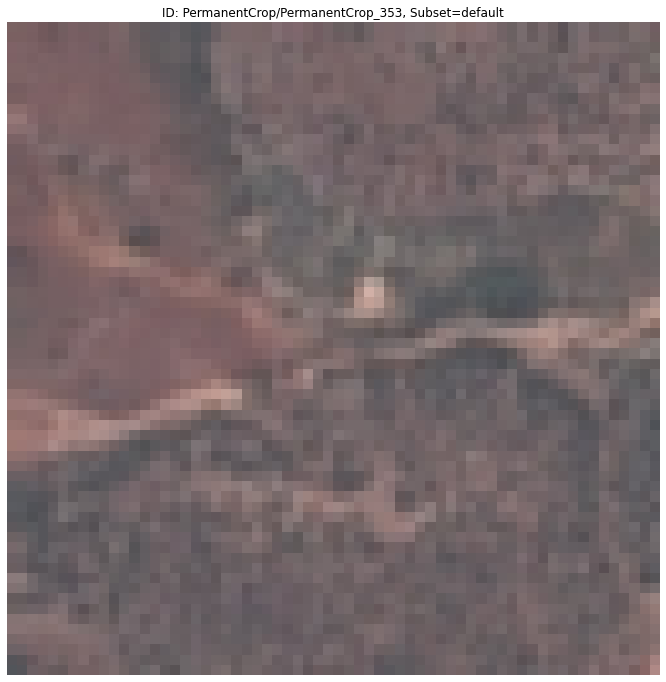

In [6]:
visualizer = Visualizer(eurosat_dataset, figsize=(12, 12), alpha=0)
fig = visualizer.vis_one_sample(query.id, "default")
fig.show()

### Random result

In [7]:
random_choices = random.choices(range(len(eurosat_dataset)), k=11)
random_results = []
for i, item in enumerate(eurosat_dataset):
    if i in random_choices:
        random_results.append(item)
random_results = [query] + random_results
subset_list = []
id_list =[]
for result in random_results:
    subset_list.append(result.subset)
    id_list.append(result.id)

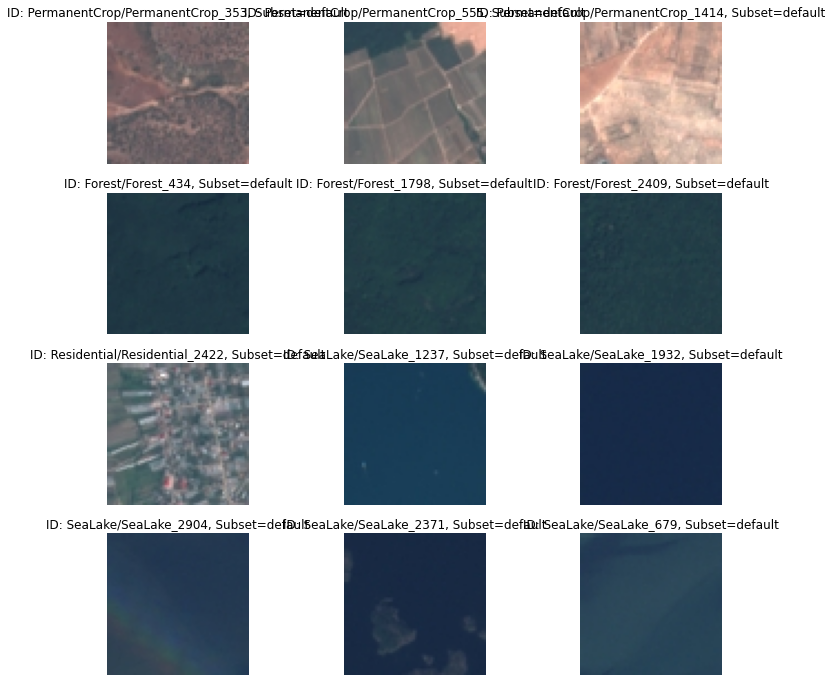

In [8]:
fig = visualizer.vis_gallery(id_list, subset_list, (None, None))
fig.show()

### Searcher result for `image` query

In [9]:
searcher = Searcher(eurosat_dataset)
topk_list = searcher.search_topk(query, topk=15)
results = [query] + topk_list[1:]

In [10]:
subset_list = []
id_list =[]
for result in results:
    subset_list.append(result.subset)
    id_list.append(result.id)

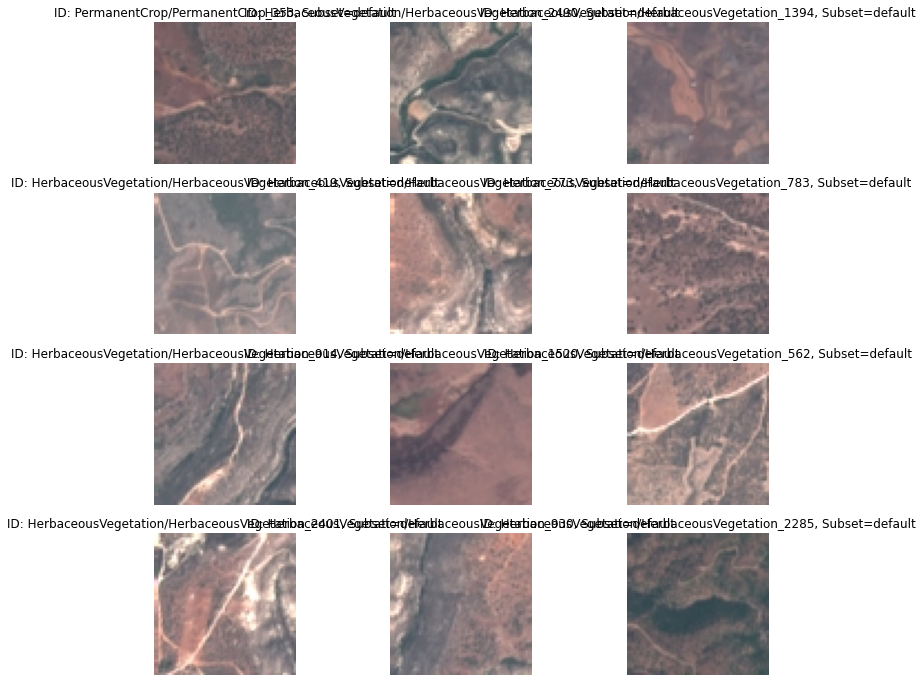

In [11]:
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

### Searcher result for `text` query

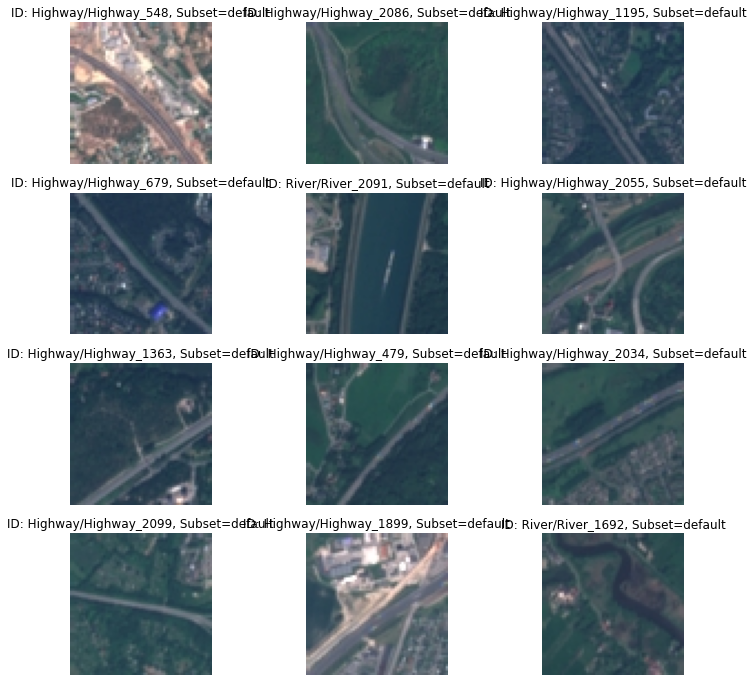

In [12]:
topk_list = searcher.search_topk("Highway", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

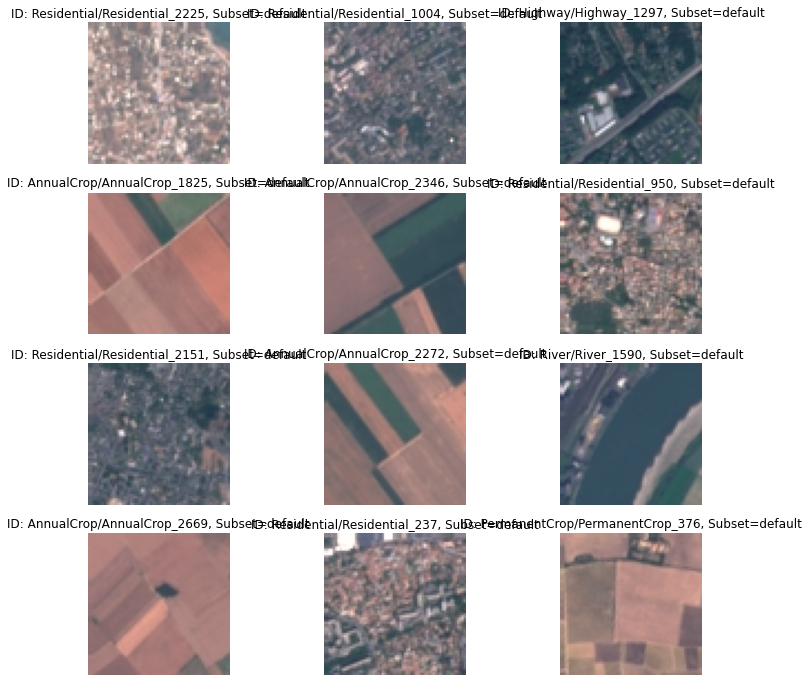

In [13]:
topk_list = searcher.search_topk("PermanentCrop", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

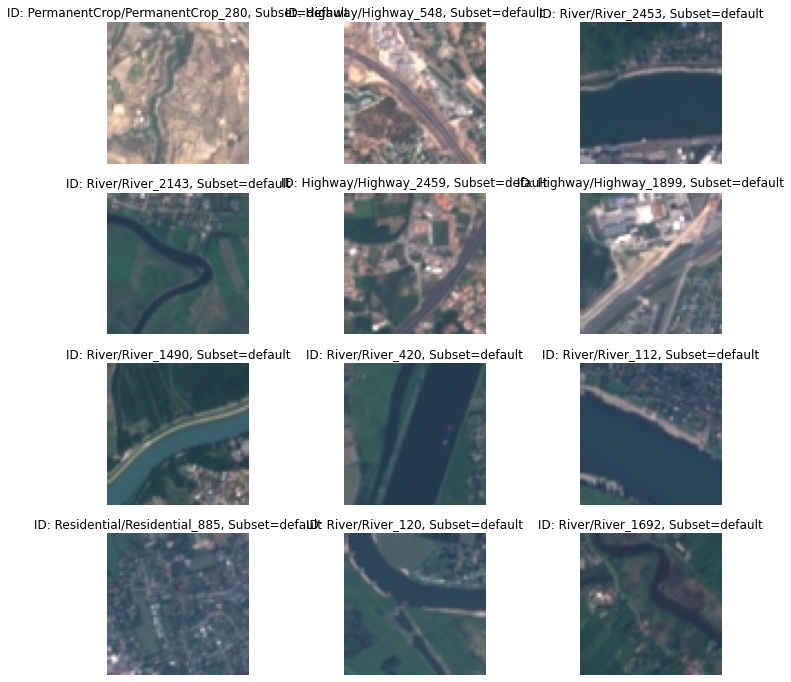

In [14]:
topk_list = searcher.search_topk("River", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

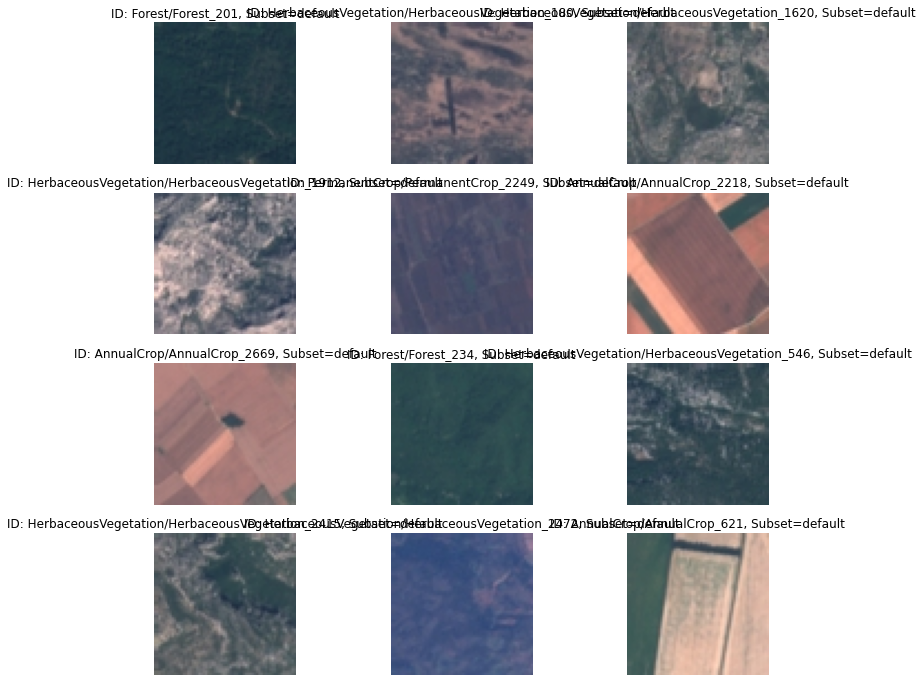

In [15]:
topk_list = searcher.search_topk("SeaLake", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

## food-101

In [16]:
start_time = time.time()
# dataset = dm.Dataset.import_from('./tests/assets/coco_dataset/coco', save_hash=True)
# dataset = dm.Dataset.import_from("coco_dataset", format='coco_instances', save_hash=True)
food_dataset = dm.Dataset.import_from("/media/hdd2/datumaro/clf_data/food-101/images", format="imagenet", save_hash=True)
print(f'setting dataset time for {len(food_dataset)} items: ', time.time()-start_time)

101000it [21:27, 78.43it/s]


setting dataset time for 101000 items:  1287.985300540924


In [17]:
food_dataset

Dataset
	size=101000
	source_path=/media/hdd2/datumaro/clf_data/food-101/images
	media_type=<class 'datumaro.components.media.Image'>
	annotated_items_count=101000
	annotations_count=101000
subsets
	default: # of items=101000, # of annotated items=101000, # of annotations=101000, annotation types=['label']
categories
	label: ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari',

In [18]:
print("Subset candidates: ", food_dataset.subsets().keys())
subset = list(food_dataset.subsets().keys())
print("Subset: ", subset)

Subset candidates:  dict_keys(['default'])
Subset:  ['default']


In [19]:
for i, item in enumerate(food_dataset):
    if i==52:
        query = item
print(query)

DatasetItem(id='oysters/146786', subset='default', media=<datumaro.components.media.Image object at 0x7fe7842914d0>, annotations=[Label(id=0, attributes={}, group=0, label=69)], attributes={}, hash_key=['c8a4a05a9b3bf1815240afa205928e6c2539d5af214138c7e4bf715ce42773bd77bb2d8ced91d98dcb4c190fc43b6890c7d513bd9827d39940c46516e2aa19b7'])


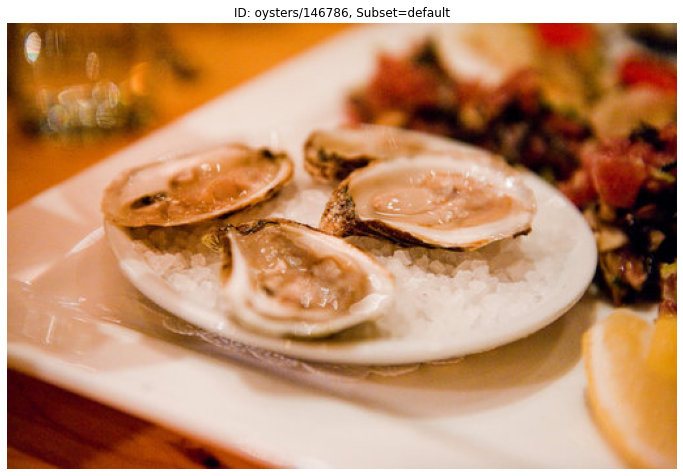

In [20]:
visualizer = Visualizer(food_dataset, figsize=(12, 12), alpha=0)
fig = visualizer.vis_one_sample(query.id, "default")
fig.show()

### Random result

In [21]:
random_choices = random.choices(range(len(food_dataset)), k=11)
random_results = []
for i, item in enumerate(food_dataset):
    if i in random_choices:
        random_results.append(item)
random_results = [query] + random_results
subset_list = []
id_list =[]
for result in random_results:
    subset_list.append(result.subset)
    id_list.append(result.id)

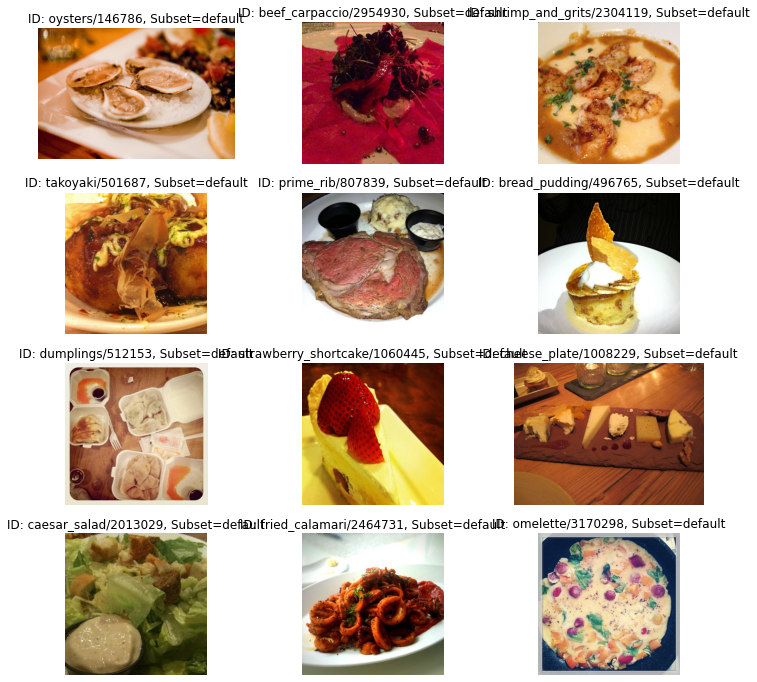

In [22]:
fig = visualizer.vis_gallery(id_list, subset_list, (None, None))
fig.show()

### Searcher result with `image` query

In [23]:
searcher = Searcher(food_dataset)
topk_list = searcher.search_topk(query, topk=15)
results = [query] + topk_list[1:]

In [24]:
subset_list = []
id_list =[]
for result in results:
    subset_list.append(result.subset)
    id_list.append(result.id)

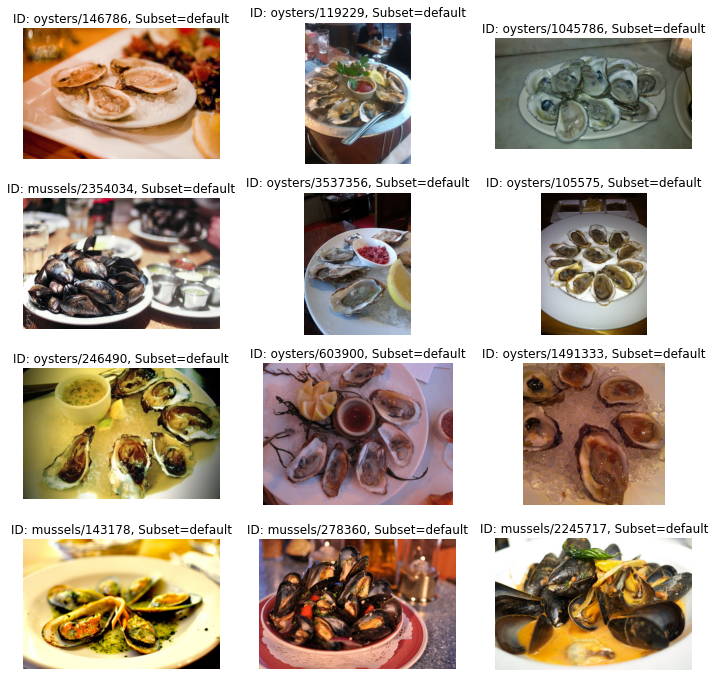

In [25]:
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

### Searcher result with `text` query

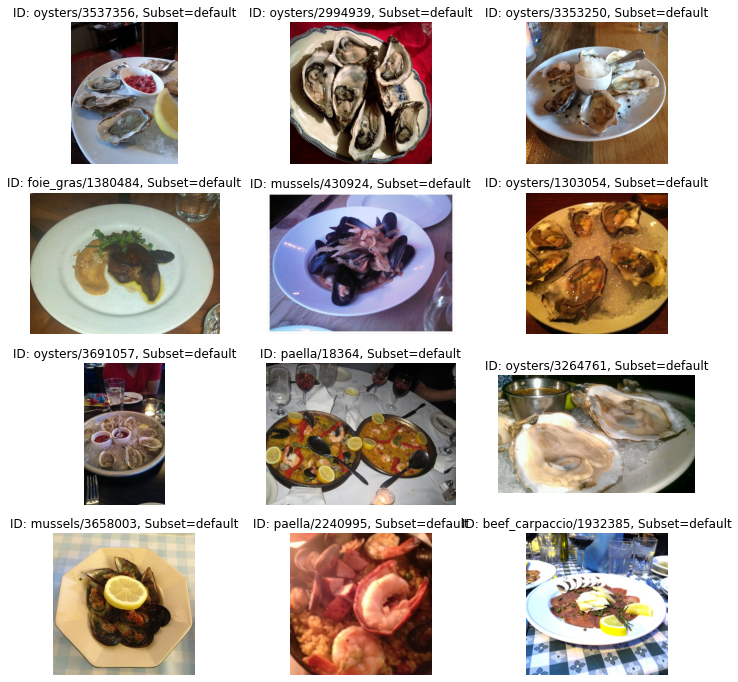

In [26]:
topk_list = searcher.search_topk("oysters", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

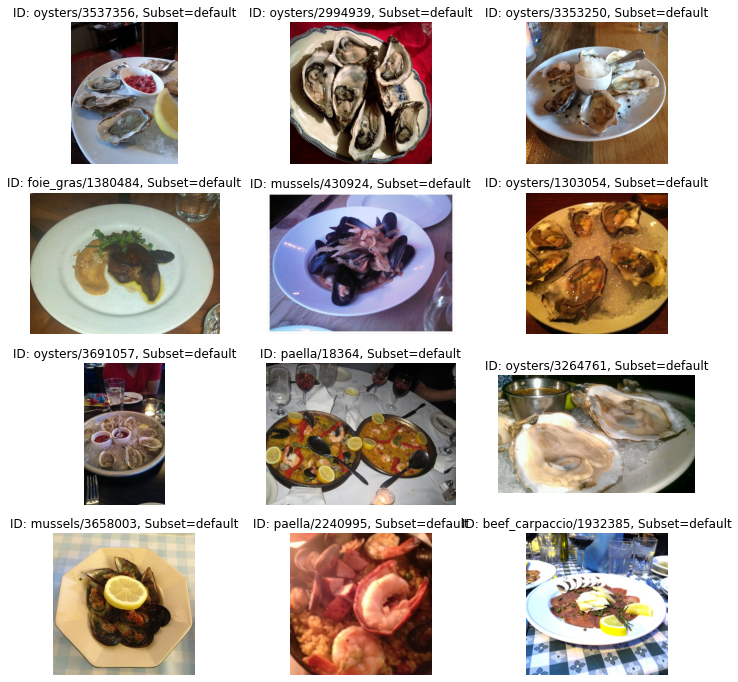

In [27]:
topk_list = searcher.search_topk("oysters", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

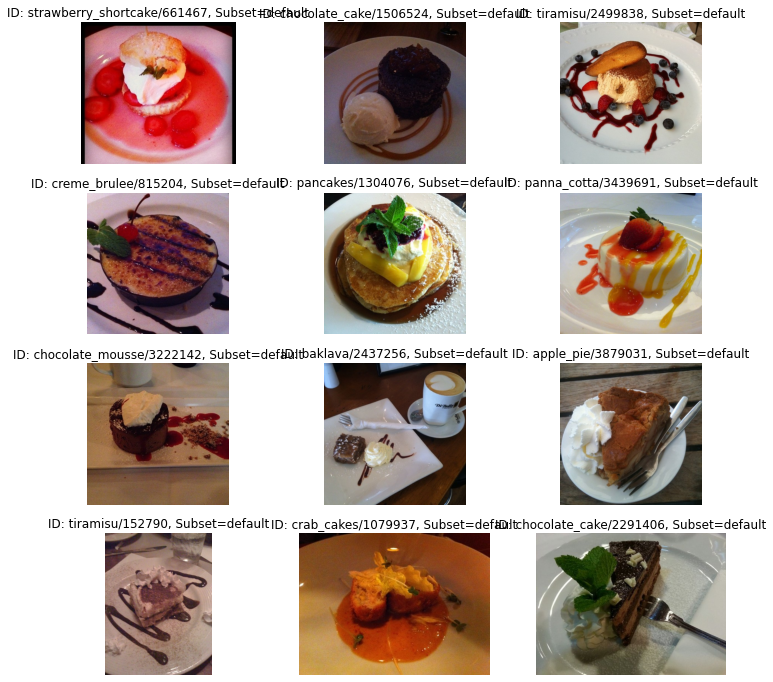

In [28]:
topk_list = searcher.search_topk("strawberry_shortcake", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

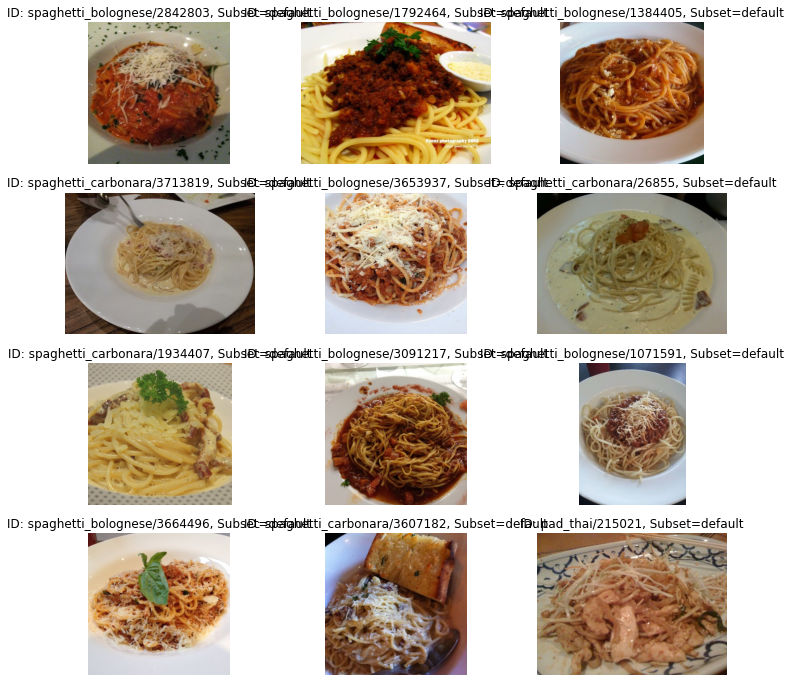

In [29]:
topk_list = searcher.search_topk("spaghetti_carbonara", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

## malaria

In [30]:
start_time = time.time()
# dataset = dm.Dataset.import_from('./tests/assets/coco_dataset/coco', save_hash=True)
# dataset = dm.Dataset.import_from("coco_dataset", format='coco_instances', save_hash=True)
malaria_dataset = dm.Dataset.import_from("/media/hdd2/datumaro/clf_data/malaria/train", format="imagenet", save_hash=True)
print(f'setting dataset time for {len(malaria_dataset)} items: ', time.time()-start_time)

13778it [02:01, 113.53it/s]

setting dataset time for 13778 items:  121.40071225166321


In [31]:
malaria_dataset

Dataset
	size=13778
	source_path=/media/hdd2/datumaro/clf_data/malaria/train
	media_type=<class 'datumaro.components.media.Image'>
	annotated_items_count=13778
	annotations_count=13778
subsets
	default: # of items=13778, # of annotated items=13778, # of annotations=13778, annotation types=['label']
categories
	label: ['Parasitized', 'Uninfected']

In [32]:
print("Subset candidates: ", malaria_dataset.subsets().keys())
subset = list(malaria_dataset.subsets().keys())
print("Subset: ", subset)

Subset candidates:  dict_keys(['default'])
Subset:  ['default']


In [33]:
for i, item in enumerate(malaria_dataset):
    if i==52:
        query = item
print(query)

DatasetItem(id='Uninfected/C90P51ThinF_IMG_20150821_120044_cell_23', subset='default', media=<datumaro.components.media.Image object at 0x7fe6bcf26d50>, annotations=[Label(id=0, attributes={}, group=0, label=1)], attributes={}, hash_key=['89f1ee06c443b94b00da0e36aa981b3bb79c58fda5626b22a95ff968e5b861ed889fbf5fb519399ce9f03fe7a121bb12949b26af02f2db55e687eba997aeb397'])


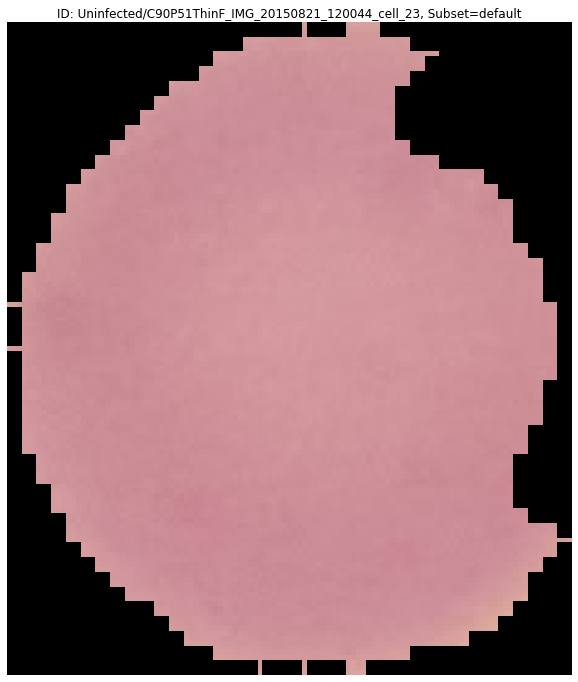

In [34]:
visualizer = Visualizer(malaria_dataset, figsize=(12, 12), alpha=0)
fig = visualizer.vis_one_sample(query.id, "default")
fig.show()

### Random result

In [35]:
random_choices = random.choices(range(len(malaria_dataset)), k=11)
random_results = []
for i, item in enumerate(malaria_dataset):
    if i in random_choices:
        random_results.append(item)
random_results = [query] + random_results
subset_list = []
id_list =[]
for result in random_results:
    subset_list.append(result.subset)
    id_list.append(result.id)

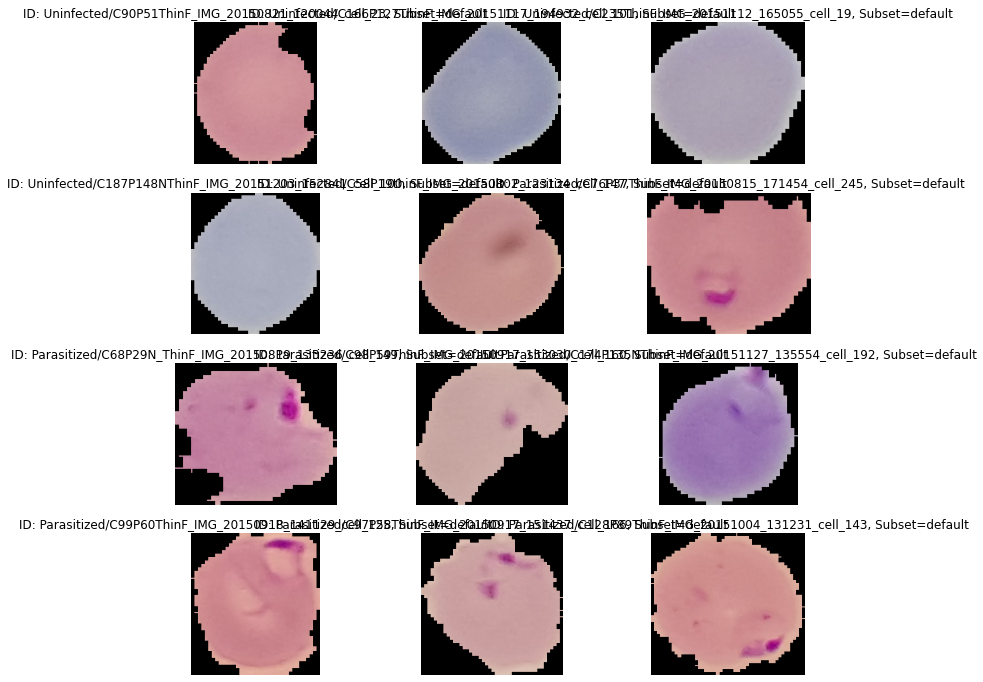

In [36]:
fig = visualizer.vis_gallery(id_list, subset_list, (None, None))
fig.show()

### Searcher result with `image` query

In [37]:
searcher = Searcher(malaria_dataset)
topk_list = searcher.search_topk(query, topk=15)
results = [query] + topk_list[1:]

In [38]:
subset_list = []
id_list =[]
for result in results:
    subset_list.append(result.subset)
    id_list.append(result.id)

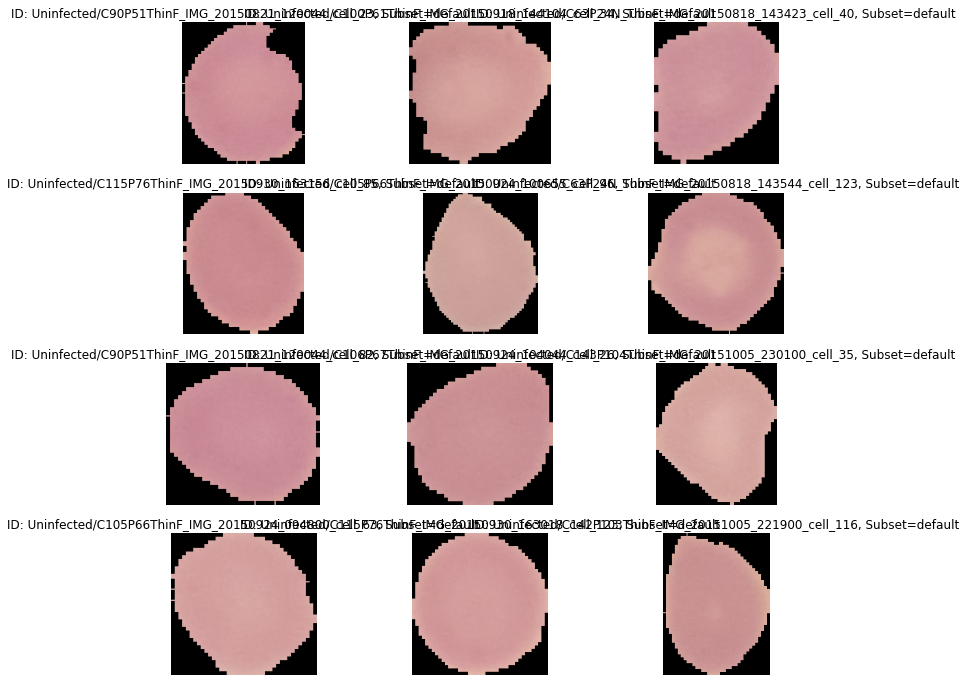

In [39]:
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

### Searcher result with `text` query

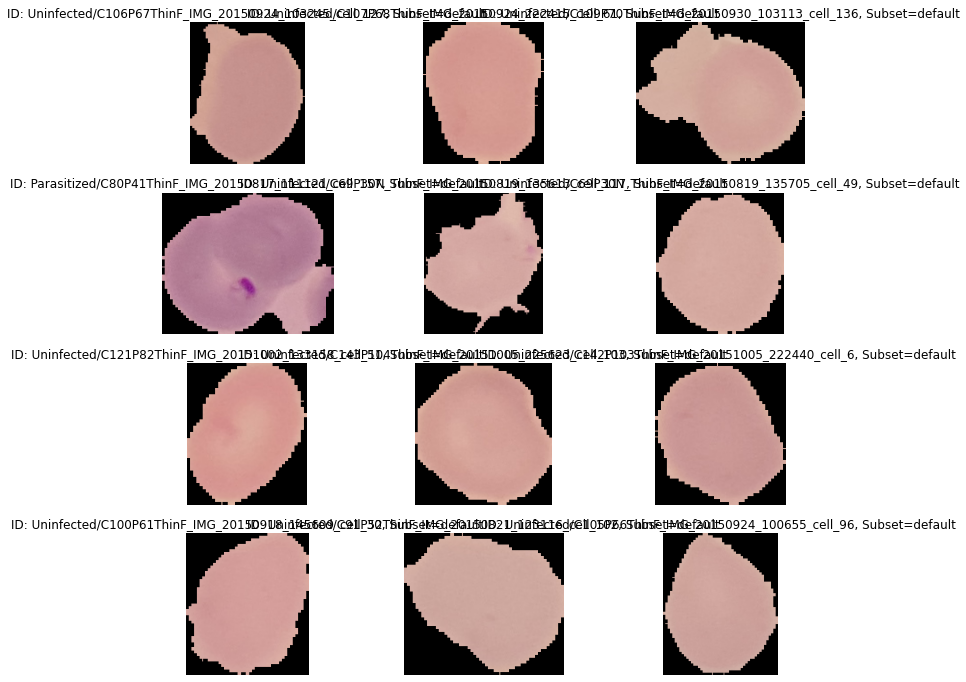

In [40]:
topk_list = searcher.search_topk("Parasitized", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

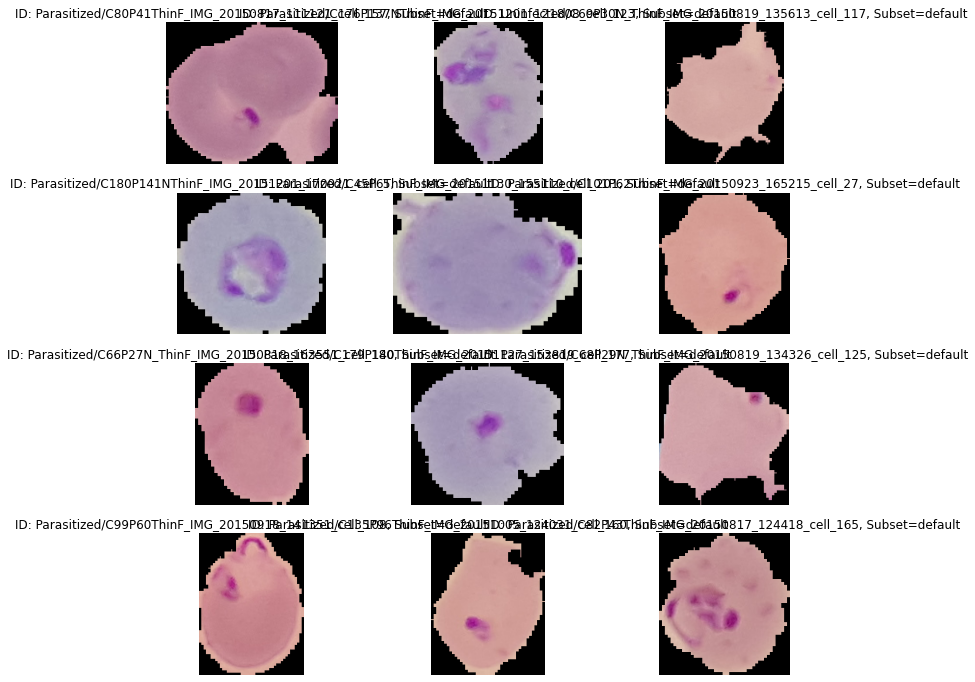

In [41]:
topk_list = searcher.search_topk("Uninfected", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

## lg_chem

In [42]:
start_time = time.time()
# dataset = dm.Dataset.import_from('./tests/assets/coco_dataset/coco', save_hash=True)
# dataset = dm.Dataset.import_from("coco_dataset", format='coco_instances', save_hash=True)
lgchem_dataset = dm.Dataset.import_from("/media/hdd2/datumaro/clf_data/lg_chem/Dataset_1", format="imagenet", save_hash=True)
print(f'setting dataset time for {len(lgchem_dataset)} items: ', time.time()-start_time)

6000it [00:52, 115.31it/s]

setting dataset time for 6000 items:  52.051884174346924


In [43]:
lgchem_dataset

Dataset
	size=6000
	source_path=/media/hdd2/datumaro/clf_data/lg_chem/Dataset_1
	media_type=<class 'datumaro.components.media.Image'>
	annotated_items_count=6000
	annotations_count=6000
subsets
	default: # of items=6000, # of annotated items=6000, # of annotations=6000, annotation types=['label']
categories
	label: ['0_OK', '1_NG_Contamination', '2_NG_Scratch', '3_NG_Dent_Protrusion']

In [44]:
print("Subset candidates: ", lgchem_dataset.subsets().keys())
subset = list(lgchem_dataset.subsets().keys())
print("Subset: ", subset)

Subset candidates:  dict_keys(['default'])
Subset:  ['default']


In [45]:
for i, item in enumerate(lgchem_dataset):
    if i==52:
        query = item
print(query)

DatasetItem(id='2_NG_Scratch/TF24K17181_v20070618_B1_4537_221_A0_C10_100.00_4', subset='default', media=<datumaro.components.media.Image object at 0x7fe677784250>, annotations=[Label(id=0, attributes={}, group=0, label=2)], attributes={}, hash_key=['a3c5d5b2c8bb1b08644607e28b9c5bb3ee25292f814e4d3ea526d10829405ba7fbff04bc5a29069ad7ea56365b2423129cadb8ad78820f8f8aaa5693710be397'])


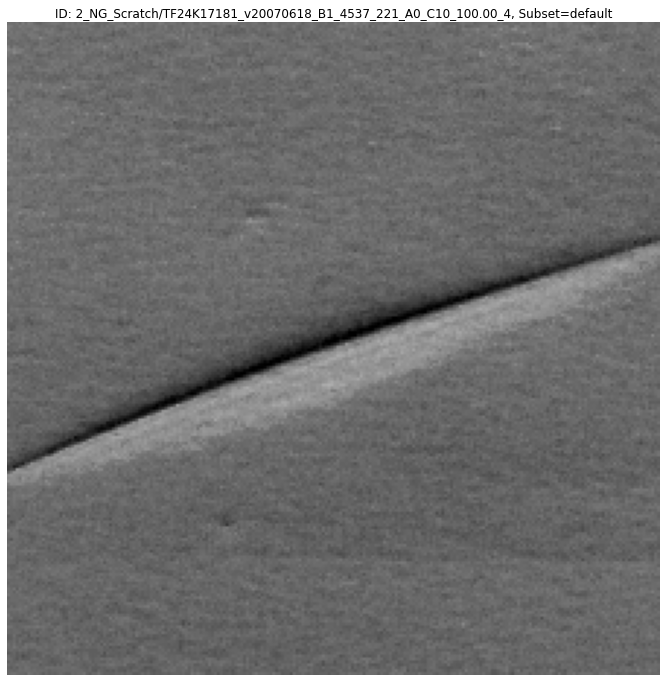

In [46]:
visualizer = Visualizer(lgchem_dataset, figsize=(12, 12), alpha=0)
fig = visualizer.vis_one_sample(query.id, "default")
fig.show()

### Random result

In [47]:
random_choices = random.choices(range(len(lgchem_dataset)), k=11)
random_results = []
for i, item in enumerate(lgchem_dataset):
    if i in random_choices:
        random_results.append(item)
random_results = [query] + random_results
subset_list = []
id_list =[]
for result in random_results:
    subset_list.append(result.subset)
    id_list.append(result.id)

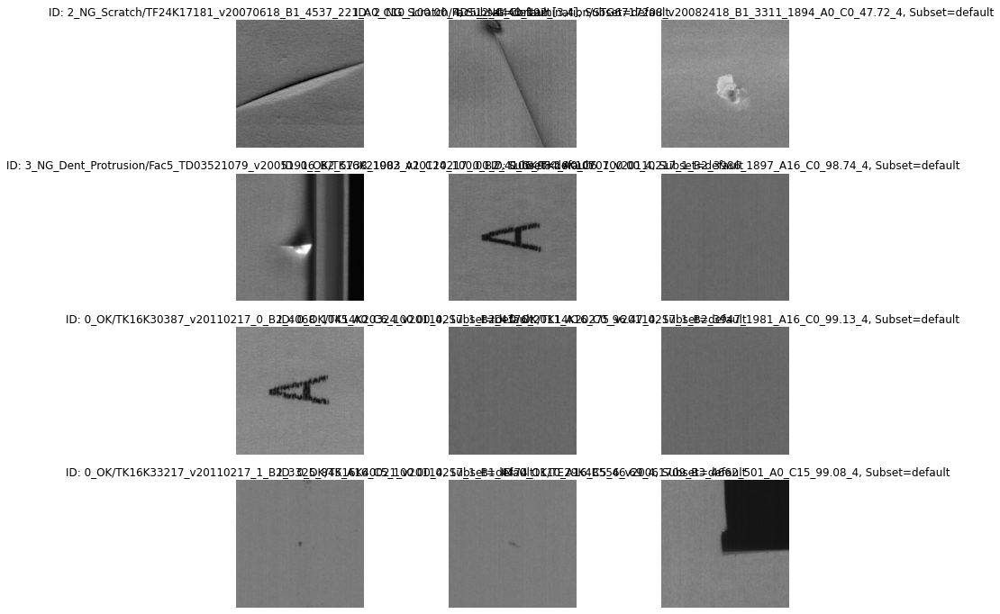

In [48]:
fig = visualizer.vis_gallery(id_list, subset_list, (None, None))
fig.show()

### Searcher result with `image` query

In [49]:
searcher = Searcher(lgchem_dataset)
topk_list = searcher.search_topk(query, topk=15)
results = [query] + topk_list[1:]

In [50]:
subset_list = []
id_list =[]
for result in results:
    subset_list.append(result.subset)
    id_list.append(result.id)

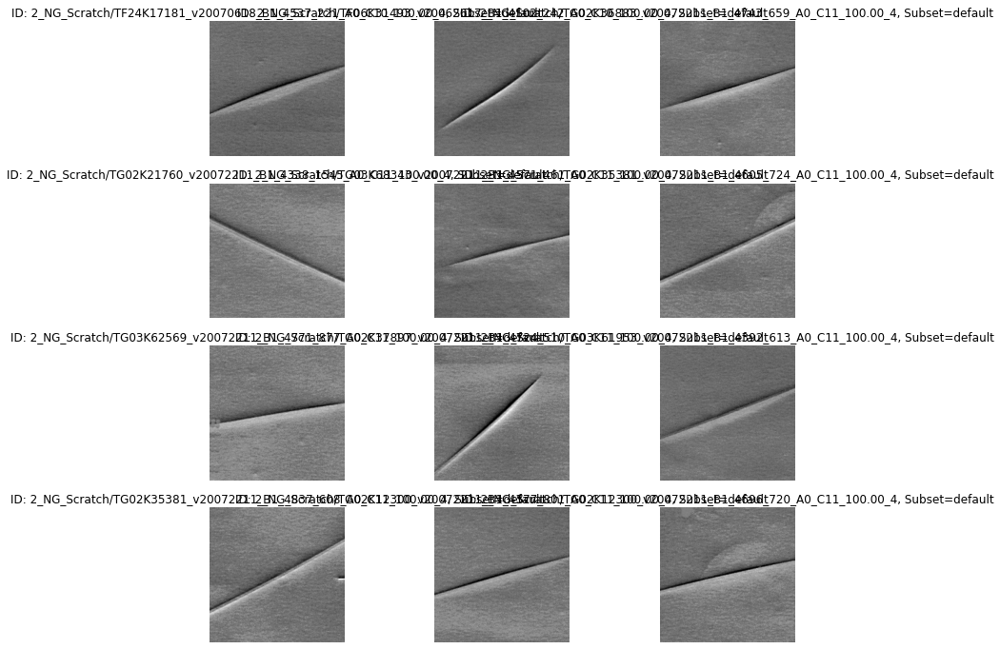

In [51]:
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

### Searcher result with `text` query

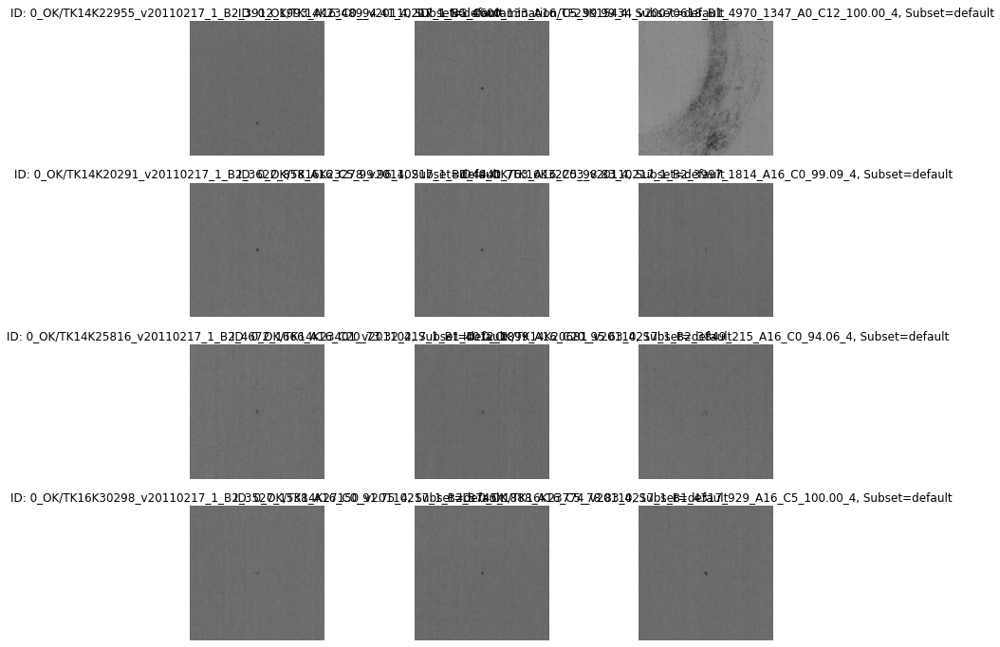

In [52]:
topk_list = searcher.search_topk("0_OK", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

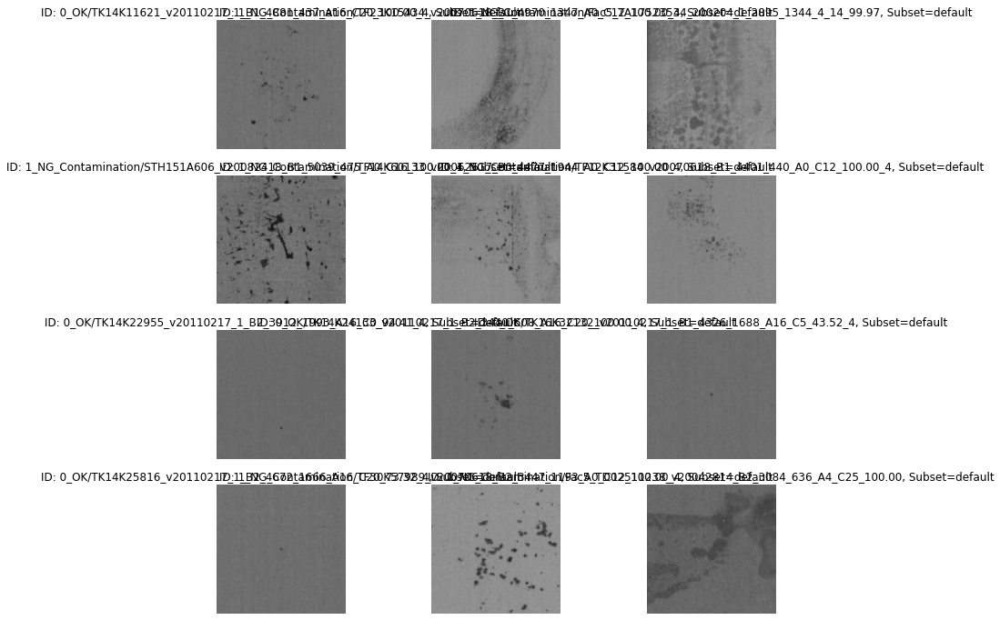

In [53]:
topk_list = searcher.search_topk("1_NG_Contamination", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

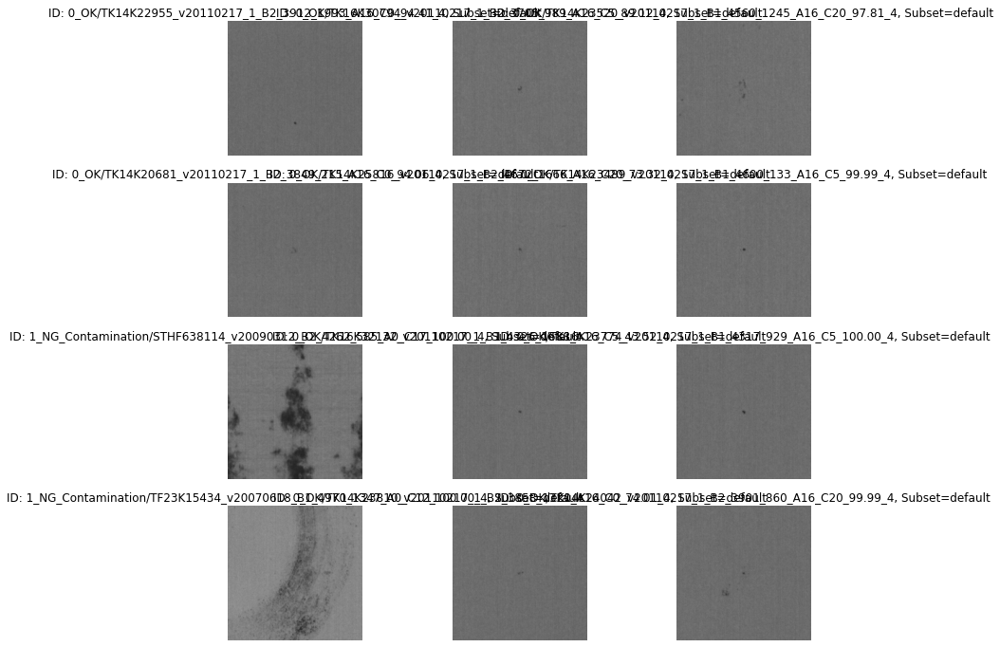

In [54]:
topk_list = searcher.search_topk("2_NG_Scratch", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

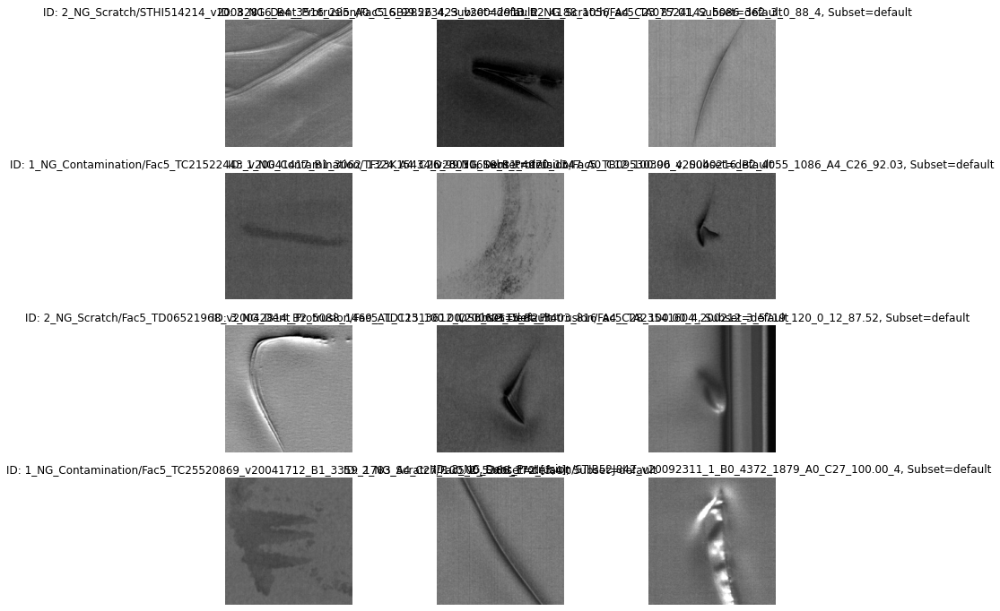

In [55]:
topk_list = searcher.search_topk("3_NG_Dent_Protrusion", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

### flowers-102

In [56]:
start_time = time.time()
# dataset = dm.Dataset.import_from('./tests/assets/coco_dataset/coco', save_hash=True)
# dataset = dm.Dataset.import_from("coco_dataset", format='coco_instances', save_hash=True)
flowers_dataset = dm.Dataset.import_from("/media/hdd2/datumaro/clf_data/flowers-102", format="imagenet", save_hash=True)
print(f'setting dataset time for {len(flowers_dataset)} items: ', time.time()-start_time)

8189it [01:58, 69.35it/s]

setting dataset time for 8189 items:  118.10880875587463


In [57]:
flowers_dataset

Dataset
	size=8189
	source_path=/media/hdd2/datumaro/clf_data/flowers-102
	media_type=<class 'datumaro.components.media.Image'>
	annotated_items_count=8189
	annotations_count=8189
subsets
	default: # of items=8189, # of annotated items=8189, # of annotations=8189, annotation types=['label']
categories
	label: ['102flowers.tgz', 'imagelabels.mat', 'jpg', 'setid.mat']

In [58]:
print("Subset candidates: ", flowers_dataset.subsets().keys())
subset = list(flowers_dataset.subsets().keys())
print("Subset: ", subset)

Subset candidates:  dict_keys(['default'])
Subset:  ['default']


In [59]:
for i, item in enumerate(flowers_dataset):
    if i==52:
        query = item
print(query)

DatasetItem(id='jpg/image_04896', subset='default', media=<datumaro.components.media.Image object at 0x7fe676857d90>, annotations=[Label(id=0, attributes={}, group=0, label=2)], attributes={}, hash_key=['d390b25f6be9fb48eb82809141a2b79a37bbbef6803a1116f2395139e515a769b65d880cbd5dc8d452542ff1ba536985c68cb52b901964839ea4efade891acbf'])


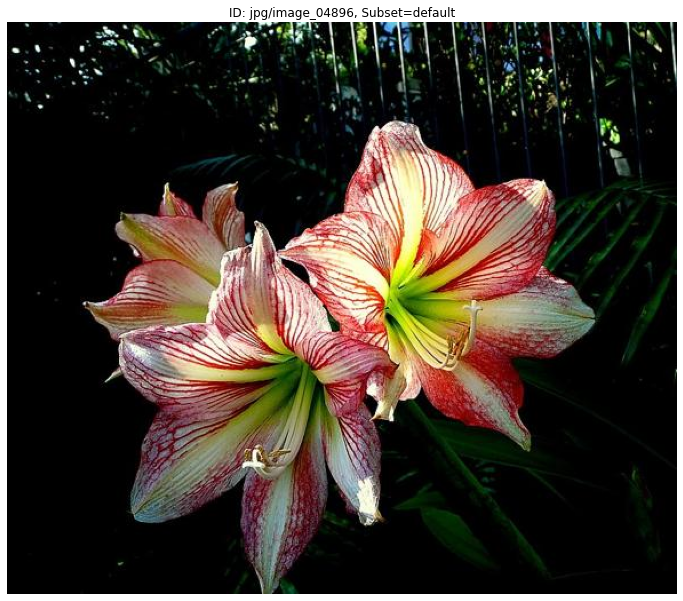

In [60]:
visualizer = Visualizer(flowers_dataset, figsize=(12, 12), alpha=0)
fig = visualizer.vis_one_sample(query.id, "default")
fig.show()

### Random result

In [61]:
random_choices = random.choices(range(len(flowers_dataset)), k=11)
random_results = []
for i, item in enumerate(flowers_dataset):
    if i in random_choices:
        random_results.append(item)
random_results = [query] + random_results
subset_list = []
id_list =[]
for result in random_results:
    subset_list.append(result.subset)
    id_list.append(result.id)

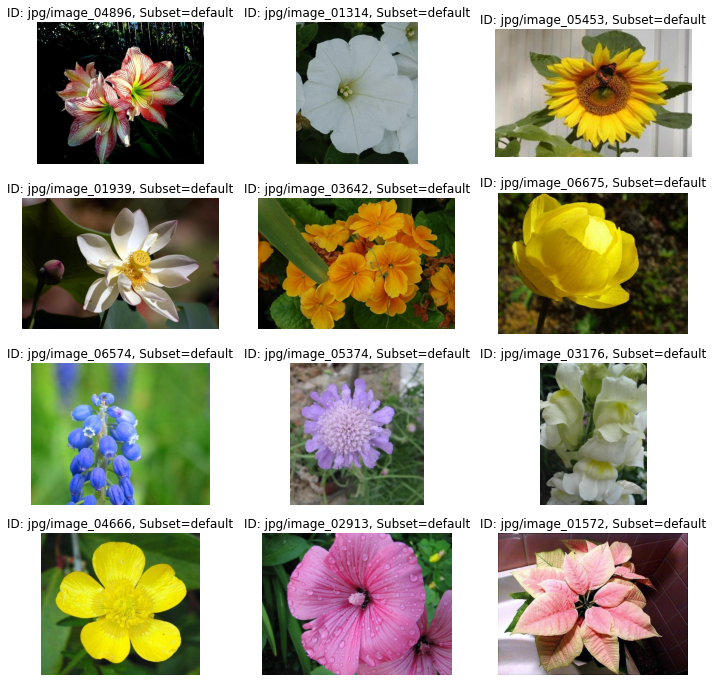

In [62]:
fig = visualizer.vis_gallery(id_list, subset_list, (None, None))
fig.show()

### Searcher result with `image` query

In [63]:
searcher = Searcher(flowers_dataset)
topk_list = searcher.search_topk(query, topk=15)
results = [query] + topk_list[1:]

In [64]:
subset_list = []
id_list =[]
for result in results:
    subset_list.append(result.subset)
    id_list.append(result.id)

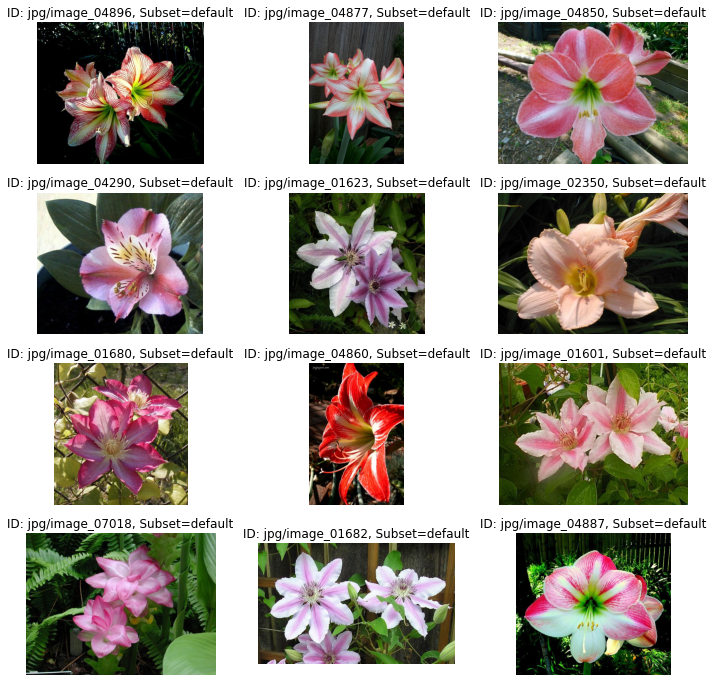

In [65]:
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

### Searcher result with `text` query

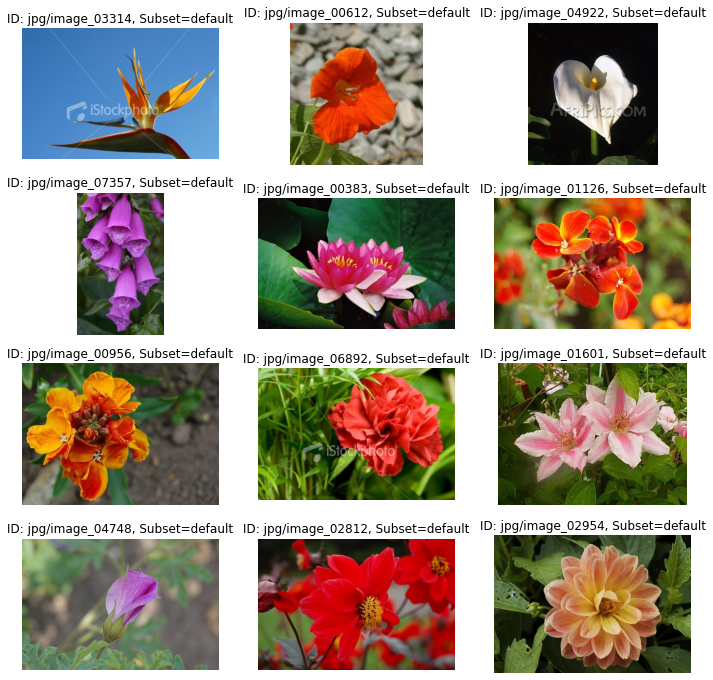

In [66]:
topk_list = searcher.search_topk("", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

### plant_leaf

In [67]:
start_time = time.time()
# dataset = dm.Dataset.import_from('./tests/assets/coco_dataset/coco', save_hash=True)
# dataset = dm.Dataset.import_from("coco_dataset", format='coco_instances', save_hash=True)
plant_dataset = dm.Dataset.import_from("/media/hdd2/datumaro/clf_data/plant_leaf/train", format="imagenet", save_hash=True)
print(f'setting dataset time for {len(plant_dataset)} items: ', time.time()-start_time)

1925it [00:18, 104.70it/s]

setting dataset time for 1925 items:  18.395811319351196


In [68]:
plant_dataset

Dataset
	size=1925
	source_path=/media/hdd2/datumaro/clf_data/plant_leaf/train
	media_type=<class 'datumaro.components.media.Image'>
	annotated_items_count=1925
	annotations_count=1925
subsets
	default: # of items=1925, # of annotated items=1925, # of annotations=1925, annotation types=['label']
categories
	label: ['Corn___Cercospora_leaf_spot Gray_leaf_spot', 'Corn___Common_rust', 'Corn___Northern_Leaf_Blight', 'Corn___healthy']

In [69]:
print("Subset candidates: ", plant_dataset.subsets().keys())
subset = list(plant_dataset.subsets().keys())
print("Subset: ", subset)

Subset candidates:  dict_keys(['default'])
Subset:  ['default']


In [70]:
for i, item in enumerate(plant_dataset):
    if i==52:
        query = item
print(query)

DatasetItem(id='Corn___healthy/image (1016)', subset='default', media=<datumaro.components.media.Image object at 0x7fe67561e990>, annotations=[Label(id=0, attributes={}, group=0, label=3)], attributes={}, hash_key=['d30df25ebd51db7c65ebec27c9995f36e69d13ce81c3591a22e591482c18714df6888a706d399fce77c3e672e922b79ae440302a3283fe4f8bc8e4ecf1d945a5'])


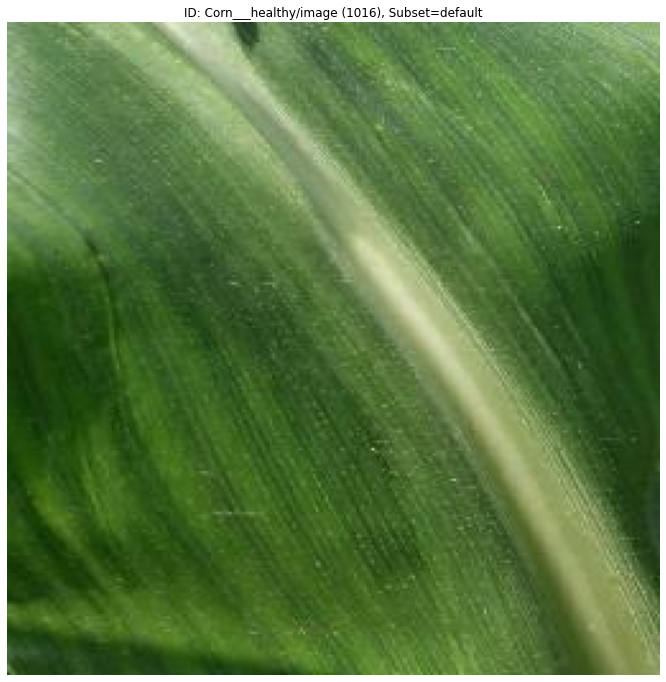

In [71]:
visualizer = Visualizer(plant_dataset, figsize=(12, 12), alpha=0)
fig = visualizer.vis_one_sample(query.id, "default")
fig.show()

### Random result

In [72]:
random_choices = random.choices(range(len(plant_dataset)), k=11)
random_results = []
for i, item in enumerate(plant_dataset):
    if i in random_choices:
        random_results.append(item)
random_results = [query] + random_results
subset_list = []
id_list =[]
for result in random_results:
    subset_list.append(result.subset)
    id_list.append(result.id)

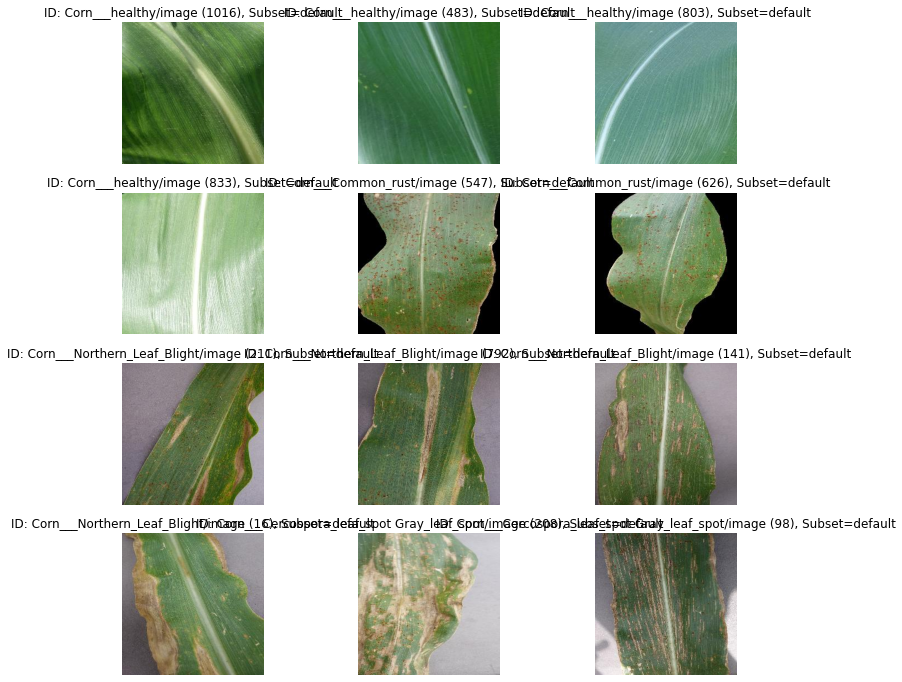

In [73]:
fig = visualizer.vis_gallery(id_list, subset_list, (None, None))
fig.show()

### Searcher result with `image` query

In [74]:
searcher = Searcher(plant_dataset)
topk_list = searcher.search_topk(query, topk=15)
results = [query] + topk_list[1:]

In [75]:
subset_list = []
id_list =[]
for result in results:
    subset_list.append(result.subset)
    id_list.append(result.id)

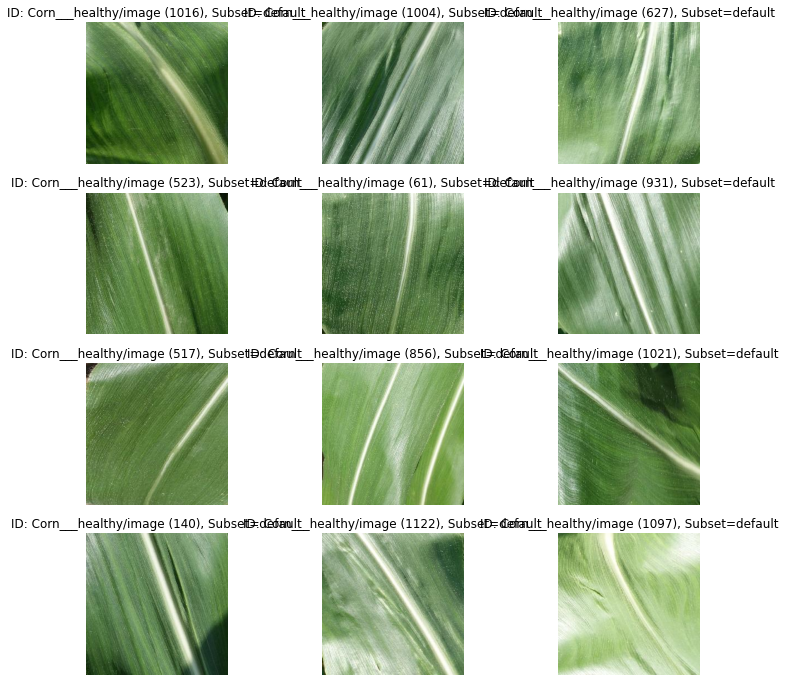

In [76]:
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

### Searcher result with `text` query

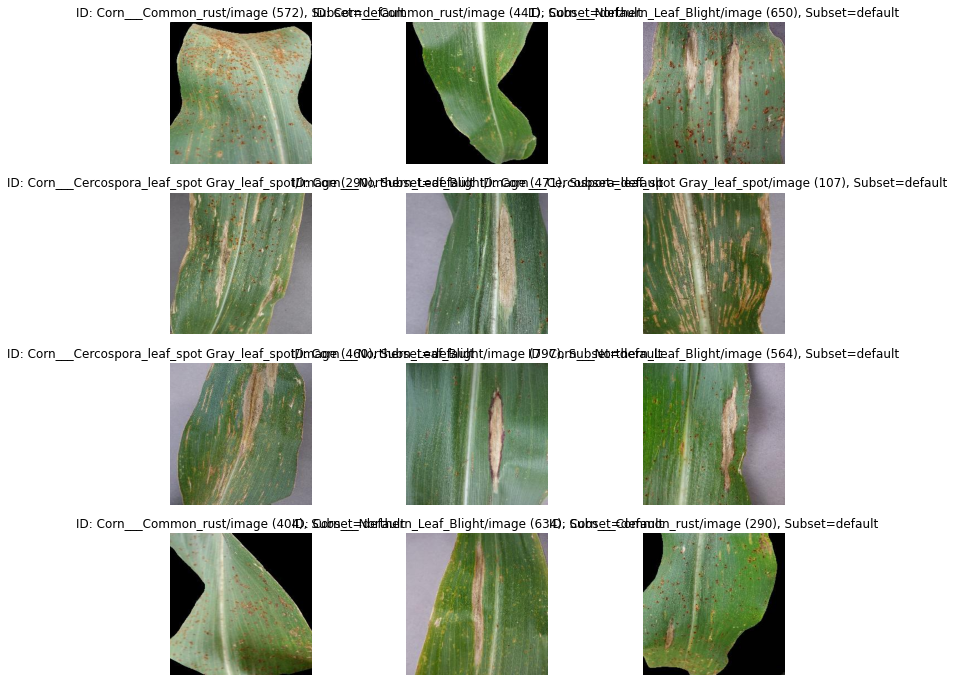

In [77]:
topk_list = searcher.search_topk("Corn___Common_rust", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()

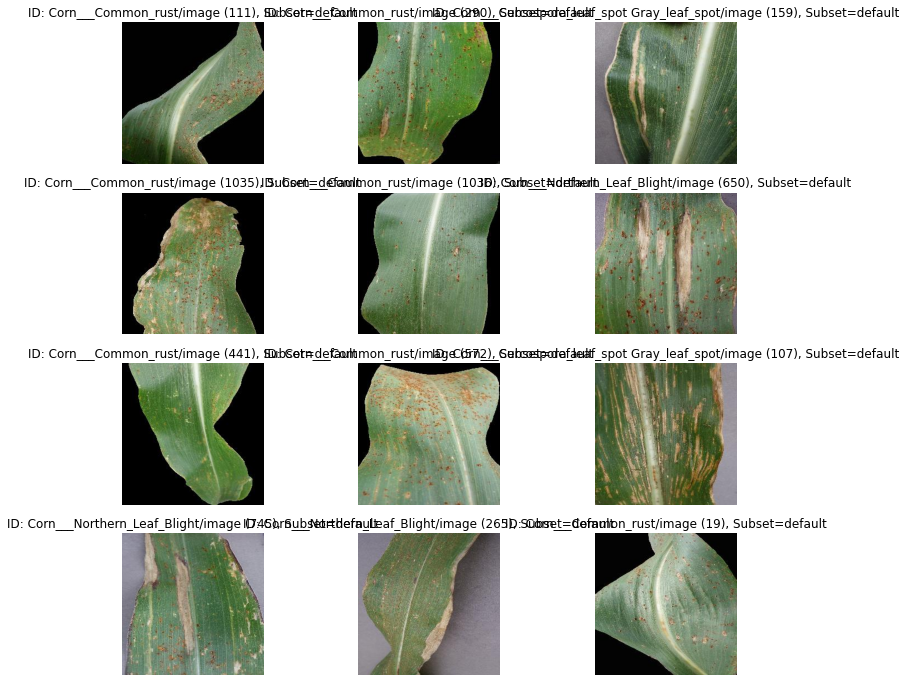

In [78]:
topk_list = searcher.search_topk("Corn___Northern_Leaf_Blight", topk=15)
subset_list = []
id_list =[]
for result in topk_list:
    subset_list.append(result.subset)
    id_list.append(result.id)
fig = visualizer.vis_gallery(id_list[:12], subset_list[:12], (None, None))
fig.show()